In [ ]:
!pip install transformers datasets adapter-transformers evaluate peft


from datasets import load_dataset

In [ ]:
import random
import numpy as np
import torch

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(22)

from datasets import load_dataset, DatasetDict, Dataset
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter
from transformers import AutoModelForSequenceClassification, AutoTokenizer, Trainer, TrainingArguments
from sklearn.preprocessing import LabelEncoder
import evaluate

ds = load_dataset("Davis/Swahili-tweet-sentiment")
train_df = pd.DataFrame(ds['train'])

print(train_df.info())

if 'id' in train_df.columns:
    train_df = train_df.drop(columns=['id'])

train_df = train_df.dropna()
train_df['Tweets'] = train_df['Tweets'].str.lower()
train_df['Tweets'] = train_df['Tweets'].str.replace(r'http\S+|www\S+|https\S+', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'\@\w+|\#', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'\d+', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'[^a-zA-Z\s]', '', regex=True)

train_df['Tweets'] = train_df['Tweets'].str.strip()



label_counts = Counter(train_df['Labels'])
print("Original label counts:", label_counts)

train_df.rename(columns={"Labels": "labels"}, inplace=True)

le = LabelEncoder()

train_df = train_df[train_df['labels'].isin([-1, 1])]

train_df['labels'] = le.fit_transform(train_df['labels'])
print("Encoded label counts:", Counter(train_df['labels']))

train_val_ds, test_ds = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['labels'])
train_ds, val_ds = train_test_split(train_val_ds, test_size=0.25, random_state=42, stratify=train_val_ds['labels'])  # 0.25 x 0.8 = 0.2


train_dataset = Dataset.from_pandas(train_ds)
val_dataset = Dataset.from_pandas(val_ds)
test_dataset = Dataset.from_pandas(test_ds)


split_ds = DatasetDict({
    'train': train_dataset,
    'validation': val_dataset,
    'test': test_dataset
})

tokenizer = AutoTokenizer.from_pretrained("castorini/afriberta_small")

def tokenize_function(examples):
    return tokenizer(
        examples['Tweets'],
        padding='max_length',
        truncation=True,
        max_length=512
    )

tokenized_ds = split_ds.map(tokenize_function, batched=True)

tokenized_ds = tokenized_ds.remove_columns(['__index_level_0__'])


num_labels = 2
baseline_model = AutoModelForSequenceClassification.from_pretrained("castorini/afriberta_small", num_labels=num_labels)

accuracy_metric = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(axis=-1)
    metrics = accuracy_metric.compute(predictions=predictions, references=labels)
    return {"accuracy": metrics["accuracy"]}

training_args = TrainingArguments(
    output_dir="./results_classification",
    evaluation_strategy="epoch",
    logging_dir="./logs_classification",
    logging_steps=100,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    learning_rate=1e-5,
    remove_unused_columns=False
)

trainer = Trainer(
    model=baseline_model,
    args=training_args,
    train_dataset=tokenized_ds['train'],
    eval_dataset=tokenized_ds['validation'],
    compute_metrics=compute_metrics
)

trainer.train()

val_results = trainer.evaluate()
print("Validation results:", val_results)

predictions = trainer.predict(tokenized_ds['test'])

logits, label_ids, _ = predictions


test_accuracy = accuracy_metric.compute(predictions=logits.argmax(axis=-1), references=label_ids)
precision, recall, f1, _ = precision_recall_fscore_support(label_ids, logits.argmax(axis=-1), average='binary')

print(f"Test accuracy: {test_accuracy['accuracy']:.2f}")
print(f"Test precision: {precision:.2f}")
print(f"Test recall: {recall:.2f}")
print(f"Test F1 score: {f1:.2f}")

unique_predictions = set(logits.argmax(axis=-1))
print("Unique predictions:", unique_predictions)



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2263 entries, 0 to 2262
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Tweets  2263 non-null   object
 1   Labels  2263 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 35.5+ KB
None
Original label counts: Counter({0: 1340, 1: 684, -1: 239})
Encoded label counts: Counter({1: 684, 0: 239})


<ipython-input-22-567517ef94ed>:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['labels'] = le.fit_transform(train_df['labels'])
/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:562: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(


Map:   0%|          | 0/553 [00:00<?, ? examples/s]

Map:   0%|          | 0/185 [00:00<?, ? examples/s]

Map:   0%|          | 0/185 [00:00<?, ? examples/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at castorini/afriberta_small and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1525: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(**kwargs)


Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.484125,0.745946
2,No log,0.414381,0.800000
3,0.451100,0.379913,0.832432
4,0.451100,0.361856,0.832432
5,0.451100,0.357638,0.832432


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 512}


Validation results: {'eval_loss': 0.3576379418373108, 'eval_accuracy': 0.8324324324324325, 'eval_runtime': 0.6483, 'eval_samples_per_second': 285.35, 'eval_steps_per_second': 18.509, 'epoch': 5.0}
Test accuracy: 0.83
Test precision: 0.88
Test recall: 0.90
Test F1 score: 0.89
Unique predictions: {0, 1}


In [ ]:
from sklearn.metrics import precision_recall_fscore_support

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(axis=-1)


    precision, recall, f1, _ = precision_recall_fscore_support(labels, predictions, average='binary')

    accuracy = accuracy_metric.compute(predictions=predictions, references=labels)['accuracy']

    return {
        "accuracy": accuracy,
        "precision": precision,
        "recall": recall,
        "f1": f1
    }


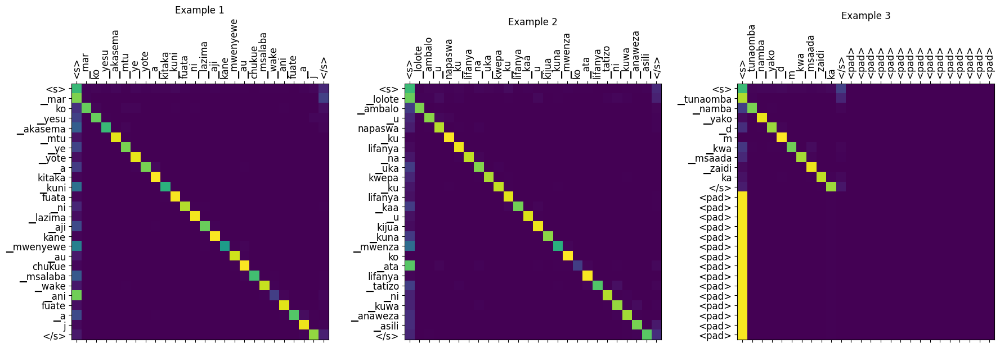

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

baseline_model.config.output_attentions = True

first_3_examples = tokenized_ds['test'][:3]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

baseline_model.to(device)

inputs = tokenizer(
    first_3_examples['Tweets'],
    padding=True,
    truncation=True,
    max_length=512,
    return_tensors="pt"
)

inputs = {key: value.to(device) for key, value in inputs.items()}

baseline_model.eval()

with torch.no_grad():
    outputs = baseline_model(**inputs)
    attentions = outputs.attentions

def plot_attention_maps(attentions, tokens_list, layer, head):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    for i, tokens in enumerate(tokens_list):
        ax = axs[i]
        attention_weights = attentions[layer][i][head].detach().cpu().numpy()

        ax.matshow(attention_weights, cmap='viridis')

        ax.set_xticks(range(len(tokens)))
        ax.set_yticks(range(len(tokens)))

        ax.set_xticklabels(tokens, rotation=90, fontsize=12)
        ax.set_yticklabels(tokens, fontsize=12)

        ax.set_title(f"Example {i+1}")

    plt.tight_layout()
    plt.show()

tokens_list = [tokenizer.convert_ids_to_tokens(inputs['input_ids'][i]) for i in range(3)]

plot_attention_maps(attentions, tokens_list, layer=0, head=0)


In [ ]:
import re

file_path = "/content/swa_wikipedia_2016_100K-sentences.txt"

with open(file_path, 'r') as file:
    data = file.readlines()

def clean_text(line):
    return re.sub(r'[^A-Za-z\s]', '', line).strip()


cleaned_data = [clean_text(line) for line in data if clean_text(line)]

print(cleaned_data)


['mashimo ya kawaida', 'Agosti  kupitia studio ya Epic Records baada ya Jackson kupata sifa kemkem pale alipoimba katika filamu ya The Wiz', 'Au je akimwomba samaki atampa nyoka', 'Basi ninalo ombi moja kwako kuhusu mwanangu Onesimo ambaye ni mwanangu katika Kristo kwani nimekuwa baba yake nikiwa kifungoni', 'Heri wanaoteswa kwa sababu ya kufanya atakavyo Mungu maana ufalme wa mbinguni ni wao', 'Julai  na Walt Disney Productions', 'Mei  baada ya mwisho wa Vita Kuu ya Pili ya Dunia', 'Novemba  alikufa mjini Istanbul', 'Oktoba  yalianza mapinduzi ya China kwa uasi wa jeshi la Wuchang', 'Safiyya binti Huyay tangu Septemba  ambaye alikuwa Myahudi akatekwa nyara katika vita vya Khybar', 'Si mnyofu wala hajui kujieleza wazi alivyo', 'wao wanaamini pombe kama ni kitu cha umuhimu kwani katika shughuli zozote za mkusanyiko lazima pombe iwepo', 'akawa mtoto mtundu na alikamatwa kwa makosa mbalimbali ikiwa ni pamoja na wizi kutumia fujo', 'Anaogopa kutoa mawazo yake mbele ya watu', 'Heri yenu nin

In [ ]:
import pandas as pd
df=pd.DataFrame(cleaned_data, columns=['text'])

In [ ]:
df['length']=df['text'].apply(len)

In [ ]:
df=df[df['length']>200]

In [ ]:

import torch
from transformers import AutoTokenizer, AutoModelForMaskedLM, Trainer, TrainingArguments
from datasets import load_dataset, Dataset
import re
import pandas as pd

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(22)

model = AutoModelForMaskedLM.from_pretrained("castorini/afriberta_small")
tokenizer = AutoTokenizer.from_pretrained("castorini/afriberta_small")
tokenizer.model_max_length = 512

text=df['text'].tolist()

def clean_text(text):
    text = re.sub(r'[^\w\s,.!?]', '', text)
    text = text.lower()
    text = re.sub(r'\s+', ' ', text).strip()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text)
    return text

cleaned_texts = [clean_text(t) for t in text]

dataset = Dataset.from_dict({"text": cleaned_texts})


def tokenize_function(examples):
    return tokenizer(examples["text"], padding="max_length", truncation=True)


tokenized_dataset = dataset.map(tokenize_function, batched=True)

train_test_split_ratio = 0.8
split_dataset = tokenized_dataset.train_test_split(test_size=1 - train_test_split_ratio)
train_dataset = split_dataset['train']
val_dataset = split_dataset['test']

from transformers import DataCollatorForLanguageModeling
data_collator = DataCollatorForLanguageModeling(
    tokenizer=tokenizer, mlm=True, mlm_probability=0.15
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

training_args = TrainingArguments(
    output_dir="./results",
    learning_rate=3e-5,
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=10,
    warmup_steps=500,
    weight_decay=0.01,
    logging_dir="./logs",
    evaluation_strategy="steps",
    fp16=True
)


trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    tokenizer=tokenizer,
    data_collator=data_collator
)


/usr/local/lib/python3.10/dist-packages/transformers/convert_slow_tokenizer.py:562: UserWarning: The sentencepiece tokenizer that you are converting to a fast tokenizer uses the byte fallback option which is not implemented in the fast tokenizers. In practice this means that the fast version of the tokenizer can produce unknown tokens whereas the sentencepiece version would have converted these unknown tokens into a sequence of byte tokens matching the original piece of text.
  warnings.warn(


Map:   0%|          | 0/5244 [00:00<?, ? examples/s]

/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1525: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(**kwargs)


In [ ]:
trainer.train()

eval_results = trainer.evaluate()
print(f"Evaluation Results: {eval_results}")

logs = trainer.state.log_history

Step,Training Loss,Validation Loss
500,3.318000,3.049653
1000,3.142500,3.024493
1500,3.036400,2.959327
2000,3.004700,2.937685
2500,2.935500,2.926850
3000,2.836500,2.971457
3500,2.784000,2.937234
4000,2.791300,2.902489
4500,2.764800,2.879640
5000,2.678900,2.935796


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 512}
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 512}
Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation 

Evaluation Results: {'eval_loss': 2.866326332092285, 'eval_runtime': 11.8714, 'eval_samples_per_second': 88.364, 'eval_steps_per_second': 11.119, 'epoch': 10.0}


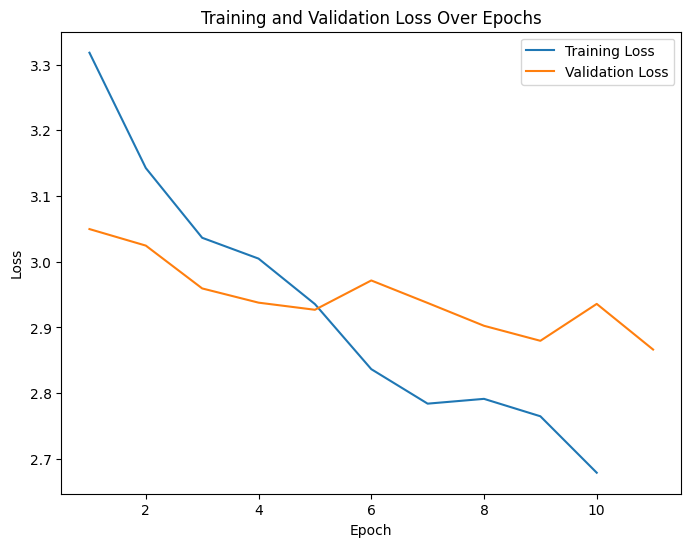

In [ ]:

training_loss = [log['loss'] for log in logs if 'loss' in log]
validation_loss = [log['eval_loss'] for log in logs if 'eval_loss' in log]
epochs = range(1, len(validation_loss) + 1)


plt.figure(figsize=(8, 6))
plt.plot(range(1, len(training_loss) + 1), training_loss, label="Training Loss")
plt.plot(epochs, validation_loss, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss Over Epochs")
plt.legend()
plt.show()

In [ ]:
model.save_pretrained('path/to/save/model')
tokenizer.save_pretrained('path/to/save/tokenizer')


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 512}


('path/to/save/tokenizer/tokenizer_config.json',
 'path/to/save/tokenizer/special_tokens_map.json',
 'path/to/save/tokenizer/sentencepiece.bpe.model',
 'path/to/save/tokenizer/added_tokens.json',
 'path/to/save/tokenizer/tokenizer.json')

In [ ]:
from datasets import load_dataset, DatasetDict, Dataset
import pandas as pd
from sklearn.model_selection import train_test_split
from collections import Counter
from transformers import AutoModelForSequenceClassification, AutoTokenizer, Trainer, TrainingArguments
from sklearn.preprocessing import LabelEncoder
import evaluate

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(22)

ds = load_dataset("Davis/Swahili-tweet-sentiment")
train_df = pd.DataFrame(ds['train'])

print(train_df.info())

if 'id' in train_df.columns:
    train_df = train_df.drop(columns=['id'])

train_df = train_df.dropna()
train_df['Tweets'] = train_df['Tweets'].str.lower()
train_df['Tweets'] = train_df['Tweets'].str.replace(r'http\S+|www\S+|https\S+', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'\@\w+|\#', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'\d+', '', regex=True)
train_df['Tweets'] = train_df['Tweets'].str.replace(r'[^a-zA-Z\s]', '', regex=True)

train_df['Tweets'] = train_df['Tweets'].str.strip()


label_counts = Counter(train_df['Labels'])
print("Original label counts:", label_counts)

train_df.rename(columns={"Labels": "labels"}, inplace=True)

le = LabelEncoder()

train_df = train_df[train_df['labels'].isin([-1, 1])]

train_df['labels'] = le.fit_transform(train_df['labels'])
print("Encoded label counts:", Counter(train_df['labels']))

train_val_ds, test_ds = train_test_split(train_df, test_size=0.2, random_state=42, stratify=train_df['labels'])
train_ds, val_ds = train_test_split(train_val_ds, test_size=0.25, random_state=42, stratify=train_val_ds['labels'])

train_dataset = Dataset.from_pandas(train_ds)
val_dataset = Dataset.from_pandas(val_ds)
test_dataset = Dataset.from_pandas(test_ds)


split_ds = DatasetDict({
    'train': train_dataset,
    'validation': val_dataset,
    'test': test_dataset
})

tokenizer = AutoTokenizer.from_pretrained("path/to/save/tokenizer")

def tokenize_function(examples):
    return tokenizer(
        examples['Tweets'],
        padding='max_length',
        truncation=True,
        max_length=512
    )


tokenized_ds = split_ds.map(tokenize_function, batched=True)

tokenized_ds = tokenized_ds.remove_columns(['__index_level_0__'])

num_labels = 2
finetuned_model = AutoModelForSequenceClassification.from_pretrained("path/to/save/model", num_labels=num_labels)

accuracy_metric = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    logits, labels = eval_pred
    predictions = logits.argmax(axis=-1)
    metrics = accuracy_metric.compute(predictions=predictions, references=labels)
    return {"accuracy": metrics["accuracy"]}

training_args = TrainingArguments(
    output_dir="./results_classification",
    evaluation_strategy="epoch",
    logging_dir="./logs_classification",
    logging_steps=100,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    learning_rate=1e-5,
    remove_unused_columns=False
)

trainer = Trainer(
    model=finetuned_model,
    args=training_args,
    train_dataset=tokenized_ds['train'],
    eval_dataset=tokenized_ds['validation'],
    compute_metrics=compute_metrics
)


trainer.train()


val_results = trainer.evaluate()
print("Validation results:", val_results)


predictions = trainer.predict(tokenized_ds['test'])

logits, label_ids, _ = predictions

test_accuracy = accuracy_metric.compute(predictions=logits.argmax(axis=-1), references=label_ids)
precision, recall, f1, _ = precision_recall_fscore_support(label_ids, logits.argmax(axis=-1), average='binary')

print(f"Test accuracy: {test_accuracy['accuracy']:.2f}")
print(f"Test precision: {precision:.2f}")
print(f"Test recall: {recall:.2f}")
print(f"Test F1 score: {f1:.2f}")

unique_predictions = set(logits.argmax(axis=-1))
print("Unique predictions:", unique_predictions)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2263 entries, 0 to 2262
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Tweets  2263 non-null   object
 1   Labels  2263 non-null   int64 
dtypes: int64(1), object(1)
memory usage: 35.5+ KB
None
Original label counts: Counter({0: 1340, 1: 684, -1: 239})
Encoded label counts: Counter({1: 684, 0: 239})


<ipython-input-24-9c15e7945953>:46: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_df['labels'] = le.fit_transform(train_df['labels'])


Map:   0%|          | 0/553 [00:00<?, ? examples/s]

Map:   0%|          | 0/185 [00:00<?, ? examples/s]

Map:   0%|          | 0/185 [00:00<?, ? examples/s]

Some weights of XLMRobertaForSequenceClassification were not initialized from the model checkpoint at path/to/save/model and are newly initialized: ['classifier.dense.bias', 'classifier.dense.weight', 'classifier.out_proj.bias', 'classifier.out_proj.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/transformers/training_args.py:1525: FutureWarning: `evaluation_strategy` is deprecated and will be removed in version 4.46 of 🤗 Transformers. Use `eval_strategy` instead
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/accelerate/accelerator.py:494: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  self.scaler = torch.cuda.amp.GradScaler(**kwargs)


Epoch,Training Loss,Validation Loss,Accuracy
1,No log,0.493151,0.740541
2,No log,0.430510,0.778378
3,0.458400,0.398407,0.783784
4,0.458400,0.379110,0.800000
5,0.458400,0.374109,0.821622


Some non-default generation parameters are set in the model config. These should go into a GenerationConfig file (https://huggingface.co/docs/transformers/generation_strategies#save-a-custom-decoding-strategy-with-your-model) instead. This warning will be raised to an exception in v4.41.
Non-default generation parameters: {'max_length': 512}


Validation results: {'eval_loss': 0.37410861253738403, 'eval_accuracy': 0.8216216216216217, 'eval_runtime': 0.7645, 'eval_samples_per_second': 241.976, 'eval_steps_per_second': 15.696, 'epoch': 5.0}
Test accuracy: 0.87
Test precision: 0.88
Test recall: 0.95
Test F1 score: 0.92
Unique predictions: {0, 1}


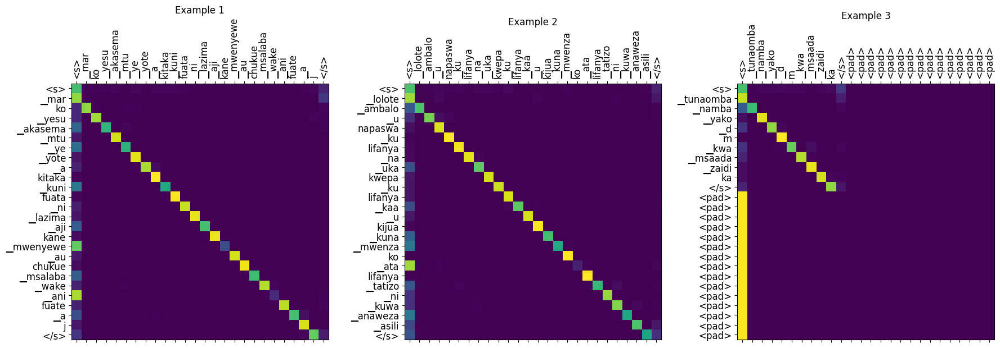

In [ ]:
import torch
import matplotlib.pyplot as plt
import numpy as np

finetuned_model.config.output_attentions = True
first_3_examples = tokenized_ds['test'][:3]


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


finetuned_model.to(device)
inputs = tokenizer(
    first_3_examples['Tweets'],
    padding=True,
    truncation=True,
    max_length=512,
    return_tensors="pt"
)

inputs = {key: value.to(device) for key, value in inputs.items()}
finetuned_model.eval()

with torch.no_grad():
    outputs = finetuned_model(**inputs)
    attentions = outputs.attentions
def plot_attention_maps(attentions, tokens_list, layer, head):
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    for i, tokens in enumerate(tokens_list):
        ax = axs[i]
        attention_weights = attentions[layer][i][head].detach().cpu().numpy()
        ax.matshow(attention_weights, cmap='viridis')
        ax.set_xticks(range(len(tokens)))
        ax.set_yticks(range(len(tokens)))

        ax.set_xticklabels(tokens, rotation=90, fontsize=12)
        ax.set_yticklabels(tokens, fontsize=12)

        ax.set_title(f"Example {i+1}")

    plt.tight_layout()
    plt.show()

tokens_list = [tokenizer.convert_ids_to_tokens(inputs['input_ids'][i]) for i in range(3)]

plot_attention_maps(attentions, tokens_list, layer=0, head=0)
